Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [1]:
# import necessary libraries
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn import tree
from matplotlib import pyplot as plt
from sklearn import metrics
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [2]:
# load mortality dataset
mortality_df = pd.read_csv('//content/drive/MyDrive/mortality_df.csv')
# view data.
mortality_df.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Mortality_Status
0,68,0,0,0,0,1,3,1,4.0,1,1,24,1,Alive
1,50,0,1,1,2,0,2,1,35.0,1,1,14,5,Alive
2,58,0,2,2,4,0,2,1,63.0,1,1,14,7,Alive
3,58,0,0,0,0,1,3,1,18.0,1,1,2,1,Alive
4,47,0,1,0,1,1,3,1,41.0,1,1,3,1,Alive


Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [3]:
# view data types
mortality_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4002 entries, 0 to 4001
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4002 non-null   int64  
 1   Sex                     4002 non-null   int64  
 2   T_Stage                 4002 non-null   int64  
 3   N_Stage                 4002 non-null   int64  
 4   6th_Stage               4002 non-null   int64  
 5   Differentiated          4002 non-null   int64  
 6   Grade                   4002 non-null   int64  
 7   A_Stage                 4002 non-null   int64  
 8   Tumor_Size              4002 non-null   float64
 9   Estrogen_Status         4002 non-null   int64  
 10  Progesterone_Status     4002 non-null   int64  
 11  Regional_Node_Examined  4002 non-null   int64  
 12  Reginol_Node_Positive   4002 non-null   int64  
 13  Mortality_Status        4002 non-null   object 
dtypes: float64(1), int64(12), object(1)
memo

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [4]:
# define dataset in features and target variable.
feature_cols = ['Age', 'Sex', 'T_Stage','N_Stage','6th_Stage','Differentiated','Grade','A_Stage','Tumor_Size','Estrogen_Status','Progesterone_Status','Regional_Node_Examined','Reginol_Node_Positive']
X = mortality_df[feature_cols] # x as our Features.
y = mortality_df['Mortality_Status'] # y as our Target variable.
# split X and y into training and testing groups for the logistic regression model.
X1_train,X1_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=42, stratify=y)

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

In [5]:
# Building base learners:
# first build the ND model
# instantiate the model (using default paramaters)
nb = GaussianNB()
# build model
nb.fit(X1_train, y_train)
# Perform predictions on the test data.
y_pred_nb=nb.predict(X1_test)

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

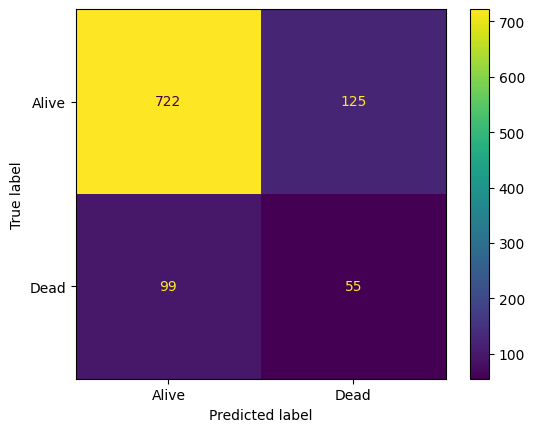

In [6]:
# Create a confusion matrix to compare.
nb_cm = confusion_matrix(y_test, y_pred_nb, labels = nb.classes_)
#Plot the confusion matrix.
nb_cm = ConfusionMatrixDisplay(nb_cm, display_labels = nb.classes_)
nb_cm.plot()

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

In [7]:
# Obtain classification Report for NB model.
# print report.
print(classification_report(y_test, y_pred_nb))

              precision    recall  f1-score   support

       Alive       0.88      0.85      0.87       847
        Dead       0.31      0.36      0.33       154

    accuracy                           0.78      1001
   macro avg       0.59      0.60      0.60      1001
weighted avg       0.79      0.78      0.78      1001



Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

In [8]:
# Build K Nearest Neighbour:
# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors = 3)
# build and Fit the classifier to the data.
knn.fit(X1_train,y_train)
# Perform predictions on the test data
y_pred_knn=knn.predict(X1_test)

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

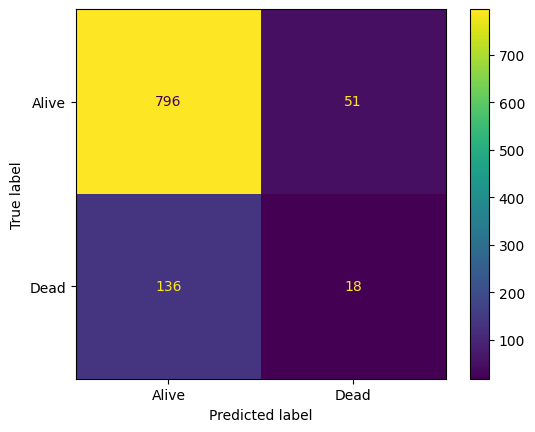

In [9]:
# Create a confusion matrix to compare.
cm_knn = confusion_matrix(y_test, y_pred_knn, labels = knn.classes_)
#Plot the confusion matrix
disp_knn_cm = ConfusionMatrixDisplay(cm_knn, display_labels=knn.classes_)
disp_knn_cm.plot()

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

In [10]:
# Obtain classification Report for KNN model.
# print report.
print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

       Alive       0.85      0.94      0.89       847
        Dead       0.26      0.12      0.16       154

    accuracy                           0.81      1001
   macro avg       0.56      0.53      0.53      1001
weighted avg       0.76      0.81      0.78      1001



Code Reuse from Seminar 7 - page 6

In [11]:
# create a dictionary of our base learner models
base_learners=[('NB', nb), ('KNN', knn)]
# create our voting classifier, inputting our models
ensemble_learner = VotingClassifier(base_learners, voting='soft')
#fit model to training data
ensemble_learner = ensemble_learner.fit(X1_train, y_train)
y_pred_ensembler_learner = ensemble_learner.predict(X1_test)

Code Reuse from Seminar 7 - page 7

Classification report for Ensmebler
              precision    recall  f1-score   support

       Alive       0.86      0.92      0.89       847
        Dead       0.31      0.21      0.25       154

    accuracy                           0.81      1001
   macro avg       0.59      0.56      0.57      1001
weighted avg       0.78      0.81      0.79      1001

Confusion_matrix for ensember learner


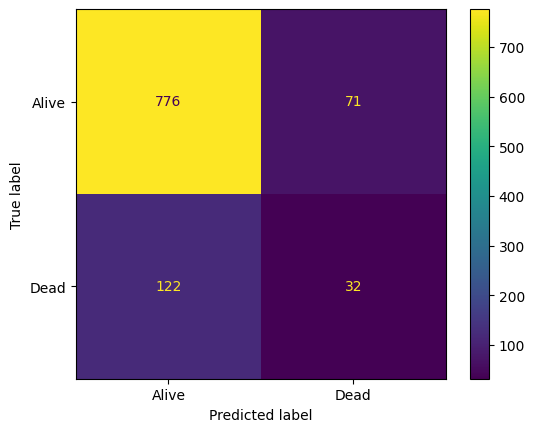

In [12]:
# Evaluate ensemble model by generating the classification report and the confusion matrix
print("Classification report for Ensmebler")
print(classification_report(y_test,y_pred_ensembler_learner))
print("Confusion_matrix for ensember learner")
ensemble_learner_cm=confusion_matrix(y_test,y_pred_ensembler_learner)
disp=ConfusionMatrixDisplay(confusion_matrix=ensemble_learner_cm,display_labels = ensemble_learner.classes_)
disp.plot()

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

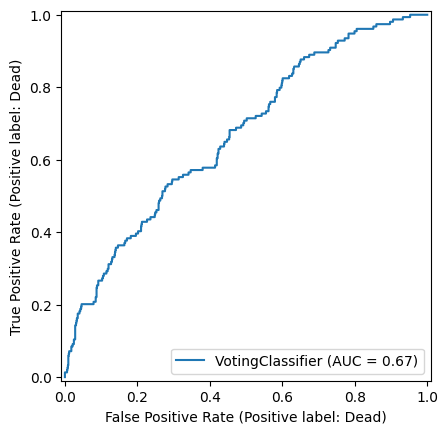

In [13]:
# create Roc Curve for the emsemble learner model.
ensemble_learner = RocCurveDisplay.from_estimator(ensemble_learner, X1_test, y_test)

Code Reuse Session 2 - week 5 (Classification Modelling and Hyperparameters Tuning)

In [14]:
# load survival months dataset and diaplay info.
survival_df = pd.read_csv('/content/drive/MyDrive/survival_df.csv')
# display column names.
list(survival_df.columns)

['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Reginol_Node_Positive',
 'Survival_Months']

Code Reuse Session 1 - week 3 (Data Understanding and Preparation)

In [15]:
# diaplay dataset dimentions.
survival_df.shape

(614, 14)

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [16]:
# define the x inputs and the y tareget output.
X = survival_df.drop(['Survival_Months'], axis=1)
y = survival_df['Survival_Months']
# split train and test data.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=10)

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [17]:
# training DT_1 model
DT_1 = DecisionTreeRegressor()
DT_1.fit(X_train, y_train)

DecisionTreeRegressor()

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [18]:
# predicte survival months for new patients.
y1_pred = DT_1.predict(X_test)

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [19]:
# print metrics for the performance of DT_1 model
print('MAE:', metrics.mean_absolute_error(y_test, y1_pred))
print('MSE:', metrics.mean_squared_error(y_test, y1_pred))
print('R2:', metrics.r2_score(y_test, y1_pred))

MAE: 26.585365853658537
MSE: 1099.8861788617887
R2: -0.9720166249652027


Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [20]:
# plot DT_1 (fully grown tree)
fully_grown_fig = plt.figure(figsize=(200,200))
DT_1_Graph = tree.plot_tree(DT_1, feature_names=list(X_train.columns), filled=True)

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [21]:
# save DT_1 as a high-resolution image.
fully_grown_fig.savefig("DT_1.svg")

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [22]:
# Create Decision Tree classifer object
DT_2 = DecisionTreeRegressor(max_depth = 4)

# Train Decision Tree Classifer
DT_2 = DT_2.fit(X_train,y_train)

#Predict the response for test dataset
y2_pred = DT_2.predict(X_test)

#You can size your plot then plot the pruned classification tree
pruned_Tree_figure = plt.figure(figsize=(200,200))
DT_2_Graph = tree.plot_tree(DT_2, feature_names=list(X_train.columns), filled=True)

#To save the pruned DT graph
pruned_Tree_figure.savefig("DT_2.svg")

Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [23]:
# print metrics for the performance of DT_1 model
print('MAE:', metrics.mean_absolute_error(y_test, y2_pred))
print('MSE:', metrics.mean_squared_error(y_test, y2_pred))
print('R2:', metrics.r2_score(y_test, y2_pred))

MAE: 19.962006054953147
MSE: 657.8069483799565
R2: -0.1794004353844214


Code Reuse Session 3 - week 9 (Regression Decision Trees Modelling and Ensemble Learning)

In [24]:
#To save the pruned DT graph
pruned_Tree_figure.savefig("DT_2.png")